In [1]:
import nilearn
from nibabel.testing import data_path
from nilearn import datasets, plotting, regions
import brainspace
import pandas as pd
import numpy as np
import os
from nilearn import surface
import nibabel as nib
import matplotlib.pyplot as plt
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
#import hcp_utils as hcp
from sklearn.neighbors import NearestNeighbors
from austin_utils import save_gifti

In [2]:
fsl_32k_left = surface.load_surf_mesh("HCP/S1200.L.inflated_MSMAll.32k_fs_LR.surf.gii")
fsl_32k_left = surface.load_surf_mesh("HCP/S1200.R.inflated_MSMAll.32k_fs_LR.surf.gii")

In [3]:
lab_l = nib.load('HCP/labels/fsLR.32k.L.label.gii').agg_data()
lab_r = nib.load('HCP/labels/fsLR.32k.R.label.gii').agg_data()
labs  = np.concatenate((lab_l, lab_r))

In [4]:
subjects = ["100206", "100307", "100408", "100610", "101006"]
gradient_list = []
for subject in subjects:
    gradient = np.load("HCP/Gradients/%s/%s.mapalign.ses1.diffmap.s02mm.npy" % (subject, subject))
    gradient_list.append(gradient)

gradients_ses1 = np.stack((gradient_list))

gradient_list = []
for subject in subjects:
    gradient = np.load("HCP/Gradients/%s/%s.mapalign.ses2.diffmap.s02mm.npy" % (subject, subject))
    gradient_list.append(gradient)

gradients_ses2 = np.stack((gradient_list))

In [5]:
labeled_grads_ses1 = np.zeros((5, 3, 32492*2))

for subject, subject_map in zip(gradients_ses1, labeled_grads_ses1):
    subject_map[0][labs != 0] = subject[0]
    subject_map[1][labs != 0] = subject[1]
    subject_map[2][labs != 0] = subject[2]


labeled_grads_ses2 = np.zeros((5, 3, 32492*2))

for subject, subject_map in zip(gradients_ses2, labeled_grads_ses2):
    subject_map[0][labs != 0] = subject[0]
    subject_map[1][labs != 0] = subject[1]
    subject_map[2][labs != 0] = subject[2]

In [6]:
gradients_subj1_ses1_df = pd.DataFrame(gradients_ses1[0].T, columns = ["Grad 1", "Grad 2", "Grad 3"])
gradients_subj1_ses2_df = pd.DataFrame(gradients_ses2[0].T, columns = ["Grad 1", "Grad 2", "Grad 3"])

gradients_subj2_ses1_df = pd.DataFrame(gradients_ses1[1].T, columns = ["Grad 1", "Grad 2", "Grad 3"])
gradients_subj2_ses2_df = pd.DataFrame(gradients_ses2[1].T, columns = ["Grad 1", "Grad 2", "Grad 3"])

In [132]:
gradients_subj1_ses1_df

,Grad 1,Grad 2,Grad 3
0,6.559657,-0.486377,-0.263979
1,-3.711139,-1.360994,0.569937
2,-3.606791,-0.467506,0.628285
3,6.340193,-1.010187,-1.858434
4,-3.236242,4.999752,-1.136122
...,...,...,...
59407,6.698299,0.088050,-0.070031
59408,6.530184,0.385336,-0.151278
59409,6.570564,0.096732,0.205395
59410,6.661353,0.061328,-0.037933


In [29]:
labs = labs.astype(float)
labs[labs == 0] = np.nan
cortical_indices = np.where(np.isnan(labs) != True)[0]

In [10]:
surf_grads_ses1 = np.empty((5, 3, 32492*2))
surf_grads_ses1[:] = np.nan

for subject, subject_map in zip(gradients_ses1, surf_grads_ses1):
    subject_map[0][cortical_indices] = subject[0]
    subject_map[1][cortical_indices] = subject[1]
    subject_map[2][cortical_indices] = subject[2]


In [11]:
surf_grads_ses2 = np.empty((5, 3, 32492*2))
surf_grads_ses2[:] = np.nan

for subject, subject_map in zip(gradients_ses2, surf_grads_ses2):
    subject_map[0][cortical_indices] = subject[0]
    subject_map[1][cortical_indices] = subject[1]
    subject_map[2][cortical_indices] = subject[2]

In [175]:
from brainspace.datasets import load_conte69
from brainspace.plotting import plot_hemispheres
surf_lh, surf_rh = load_conte69()

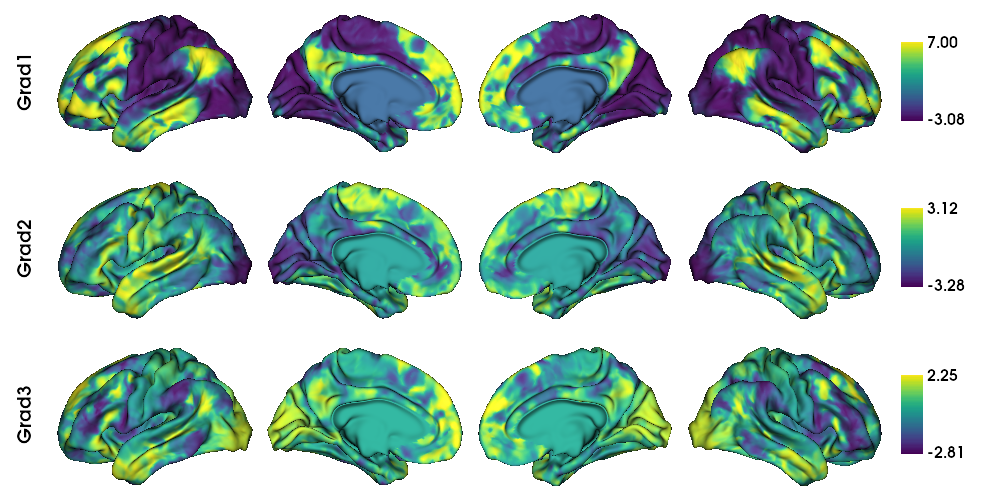

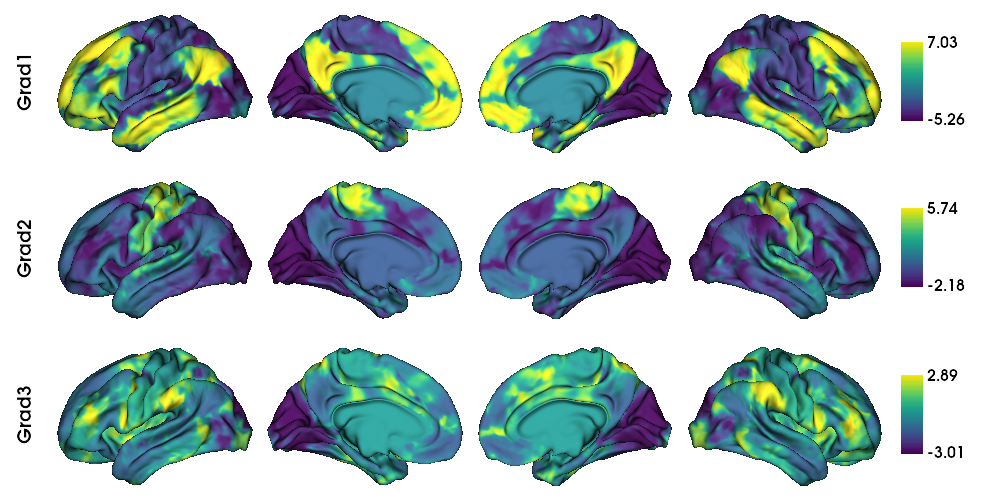

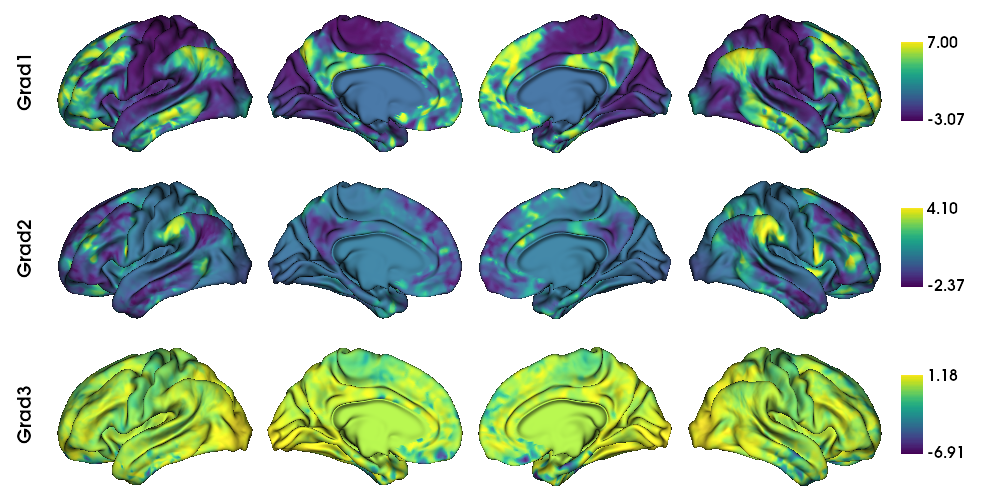

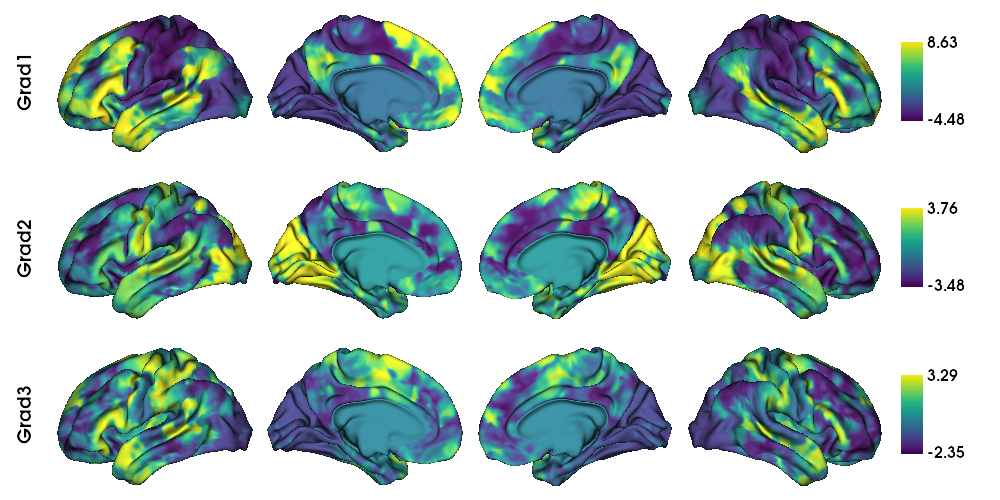

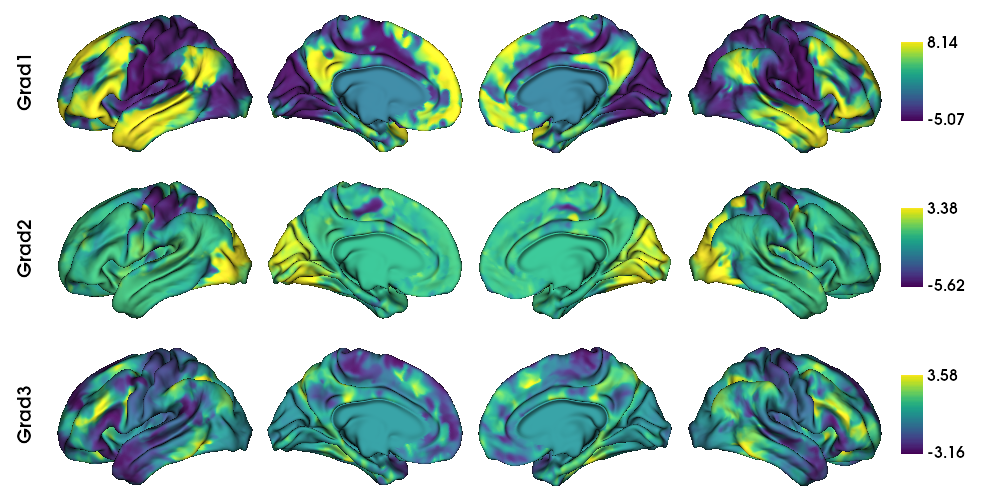

In [278]:
for subject_map in surf_grads_ses1:
    plot_hemispheres(surf_lh, surf_rh, array_name=subject_map, size=(1000, 500), cmap='viridis',
                    color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

Text(0.5, 0, 'Gradient 2')

Text(0.5, 0.5, 'Gradient 1')

Text(0.5, 0, 'Gradient 3')

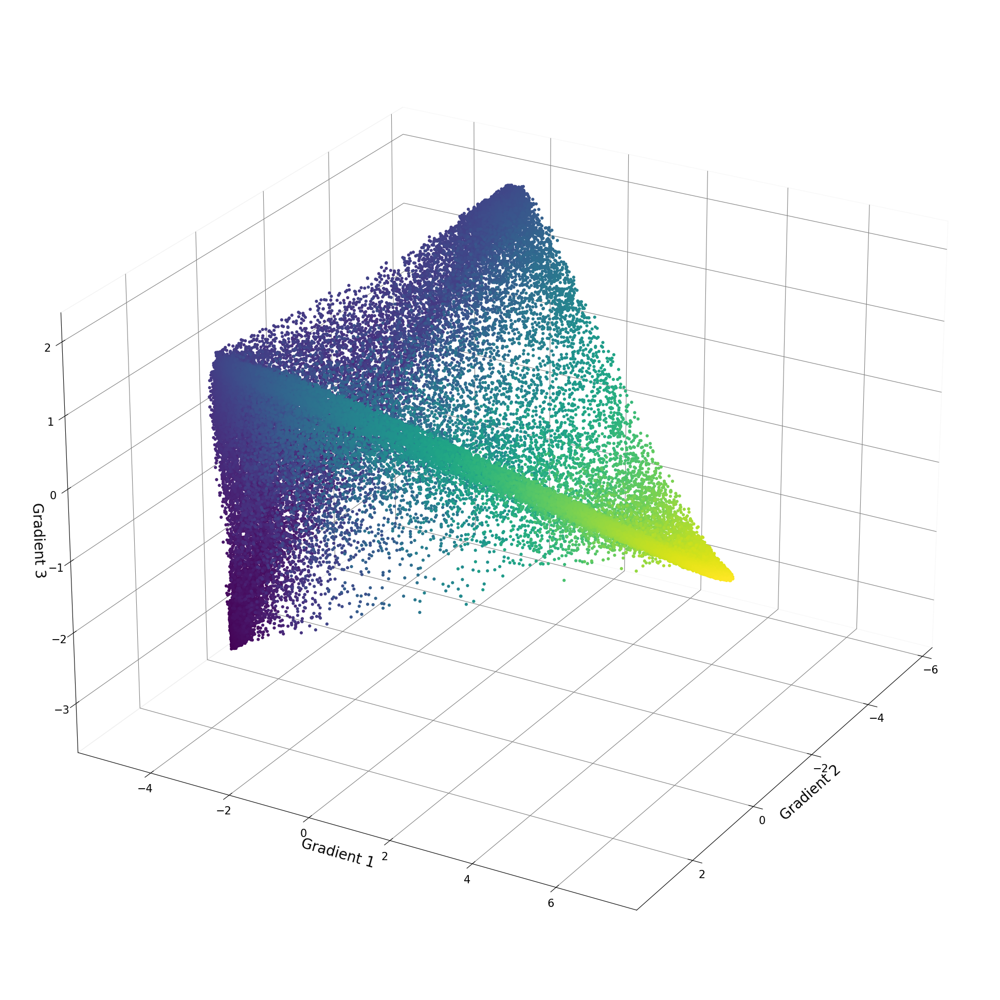

In [279]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

fig = plt.figure(figsize = ((25, 25)))
ax = fig.add_subplot(projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.xaxis.line.set_color("black")
ax.yaxis.line.set_color("black")
ax.zaxis.line.set_color("black")

ax.xaxis._axinfo["grid"]['color'] =  ("grey")
ax.yaxis._axinfo["grid"]['color'] =  ("grey")
ax.zaxis._axinfo["grid"]['color'] =  ("grey")

#cmap = ListedColormap(sns.color_palette("viridis", 256).as_hex())

ax.scatter(gradients_subj2_ses1_df["Grad 2"], gradients_subj2_ses1_df["Grad 1"], gradients_subj2_ses1_df["Grad 3"], cmap='viridis', linewidth = 0.000000001, c = gradients_subj2_ses1_df["Grad 1"], alpha =1)

# Get rid of the panes                          

ax.set_xlabel('Gradient 2', fontsize = 20)
ax.set_ylabel('Gradient 1', fontsize = 20)
ax.set_zlabel('Gradient 3',fontsize = 20)

ax.tick_params(which='major', labelsize=15)

ax.view_init(25, 30)

# legend
#plt.legend(*gradient_3d.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

plt.show()

Text(0.5, 0, 'Gradient 2')

Text(0.5, 0.5, 'Gradient 1')

Text(0.5, 0, 'Gradient 3')

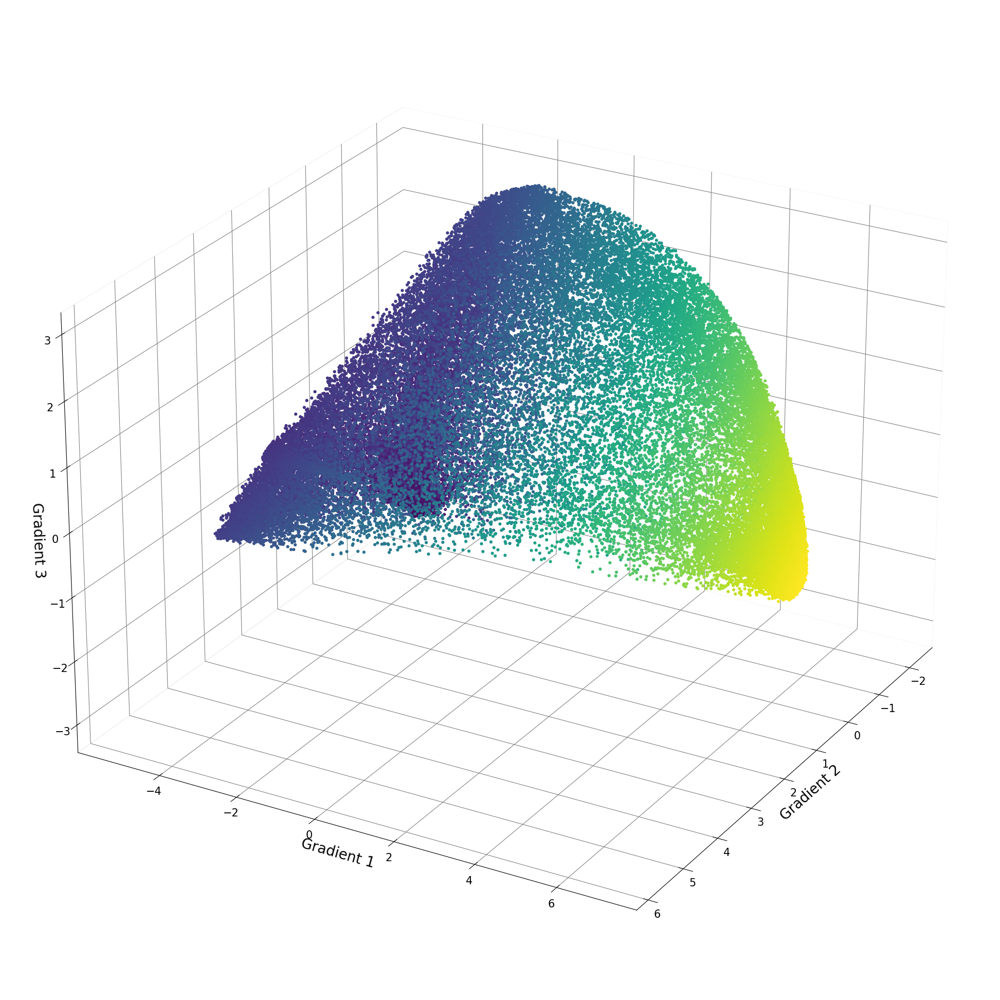

In [68]:
fig = plt.figure(figsize = ((25, 25)))
ax = fig.add_subplot(projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.xaxis.line.set_color("black")
ax.yaxis.line.set_color("black")
ax.zaxis.line.set_color("black")

ax.xaxis._axinfo["grid"]['color'] =  ("grey")
ax.yaxis._axinfo["grid"]['color'] =  ("grey")
ax.zaxis._axinfo["grid"]['color'] =  ("grey")

#cmap = ListedColormap(sns.color_palette("viridis", 256).as_hex())

ax.scatter(gradients_subj2_ses2_df["Grad 2"], gradients_subj2_ses2_df["Grad 1"], gradients_subj2_ses2_df["Grad 3"], cmap='viridis', linewidth = 0.000000001, c = gradients_subj2_ses2_df["Grad 1"], alpha =1)

# Get rid of the panes                          

ax.set_xlabel('Gradient 2', fontsize = 20)
ax.set_ylabel('Gradient 1', fontsize = 20)
ax.set_zlabel('Gradient 3',fontsize = 20)

ax.tick_params(which='major', labelsize=15)

ax.view_init(25, 30)

# legend
#plt.legend(*gradient_3d.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

plt.show()

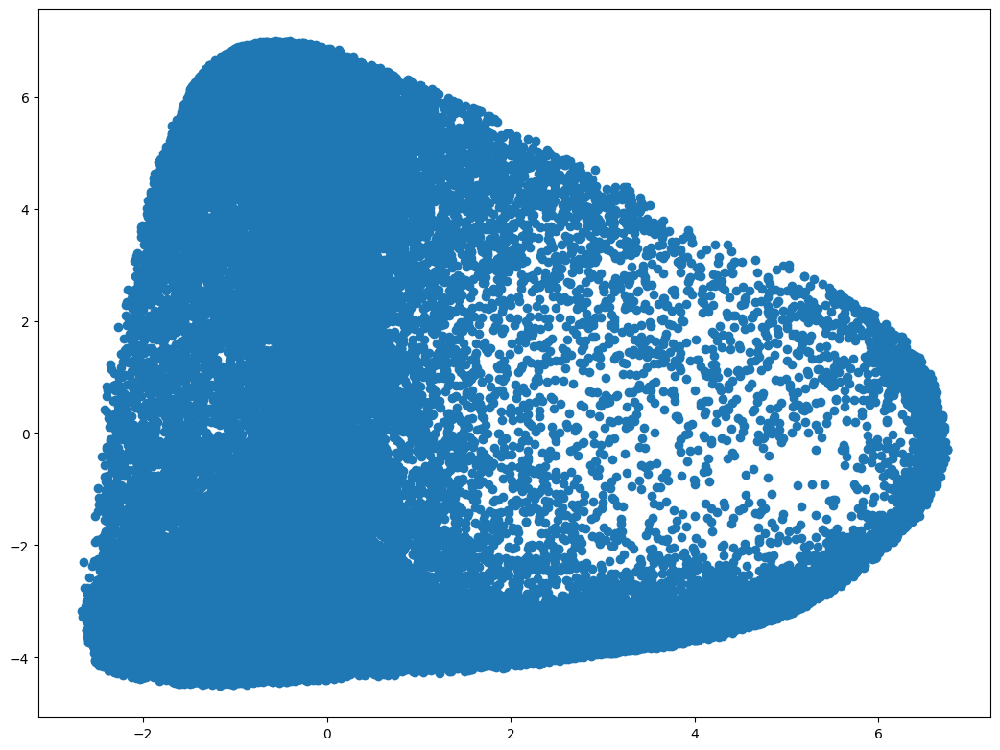

In [37]:
plt.scatter(gradients_subj1_ses1_df["Grad 2"], gradients_subj1_ses1_df["Grad 1"])
plt.show()

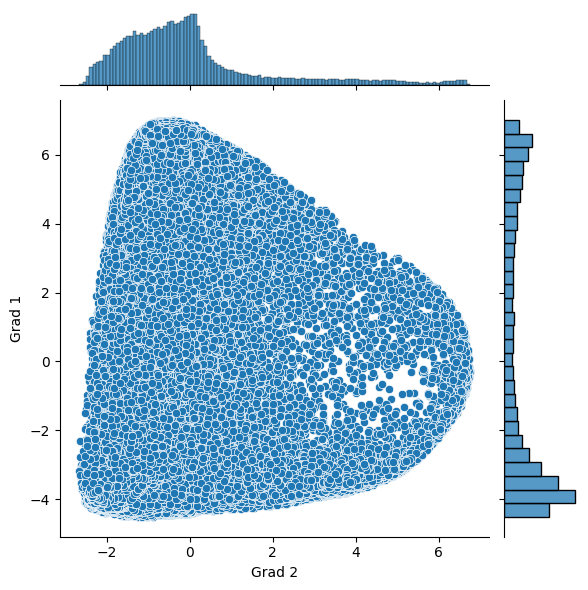

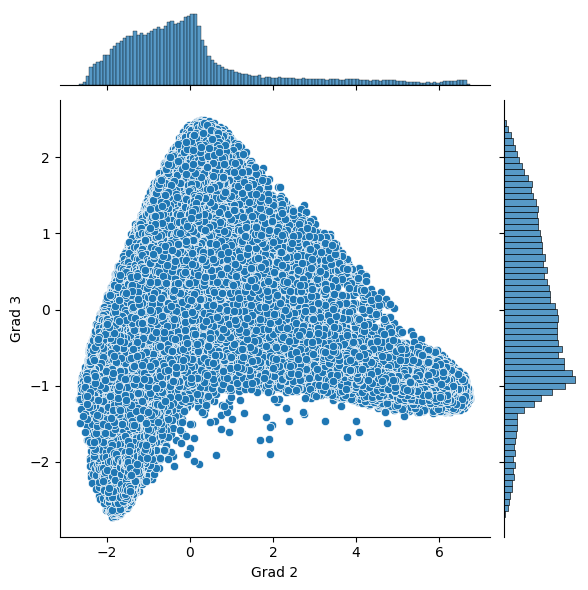

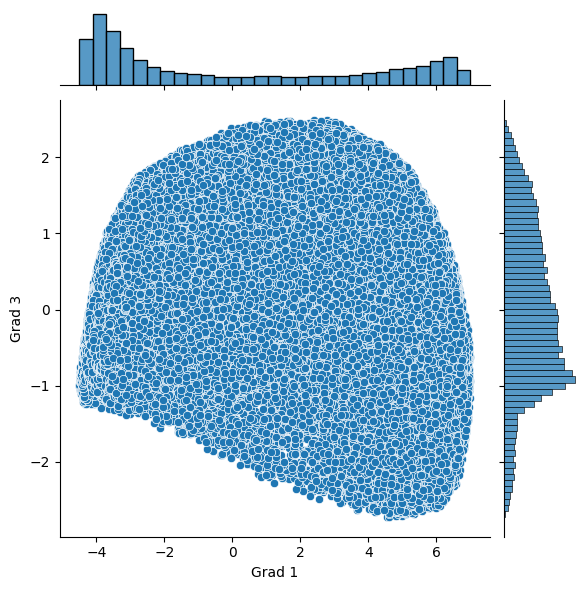

In [26]:
sns.jointplot(data = gradients_subj1_ses1_df, x = "Grad 2", y = "Grad 1") #, hue = "Grad 1", palette = "viridis"
sns.jointplot(data = gradients_subj1_ses1_df, x = "Grad 2", y = "Grad 3") #, hue = "Grad 1", palette = "viridis"
sns.jointplot(data = gradients_subj1_ses1_df, x = "Grad 1", y = "Grad 3")


In [22]:
gradients_subj1_ses1_df

,Grad 1,Grad 2,Grad 3
0,6.559657,-0.486377,-0.263979
1,-3.711139,-1.360994,0.569937
2,-3.606791,-0.467506,0.628285
3,6.340193,-1.010187,-1.858434
4,-3.236242,4.999752,-1.136122
...,...,...,...
59407,6.698299,0.088050,-0.070031
59408,6.530184,0.385336,-0.151278
59409,6.570564,0.096732,0.205395
59410,6.661353,0.061328,-0.037933


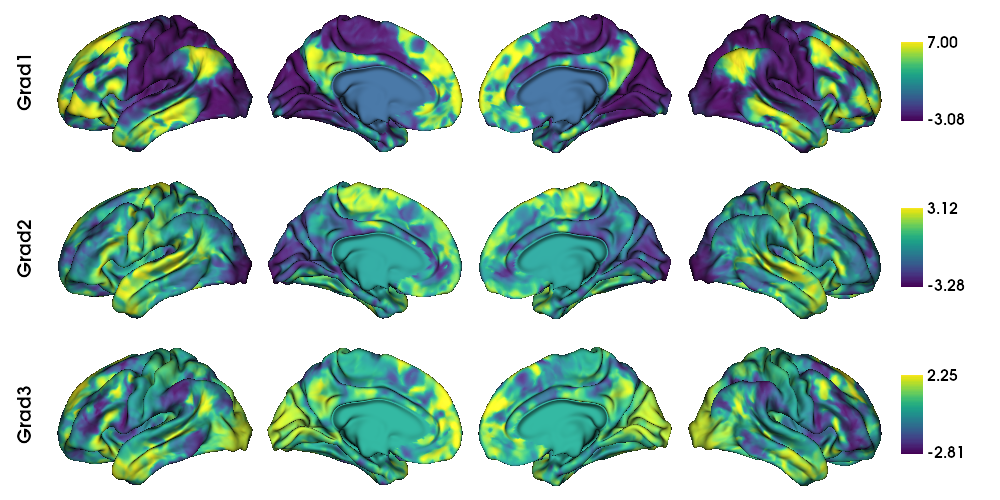

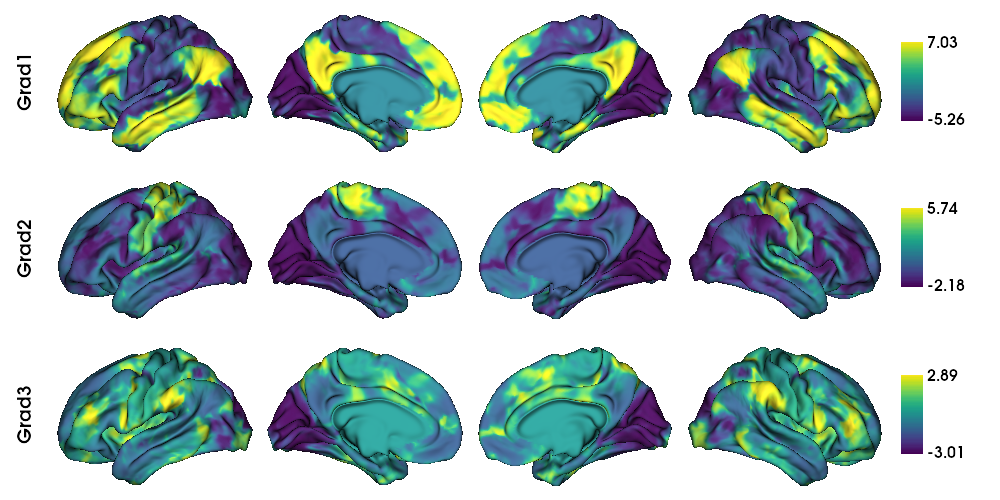

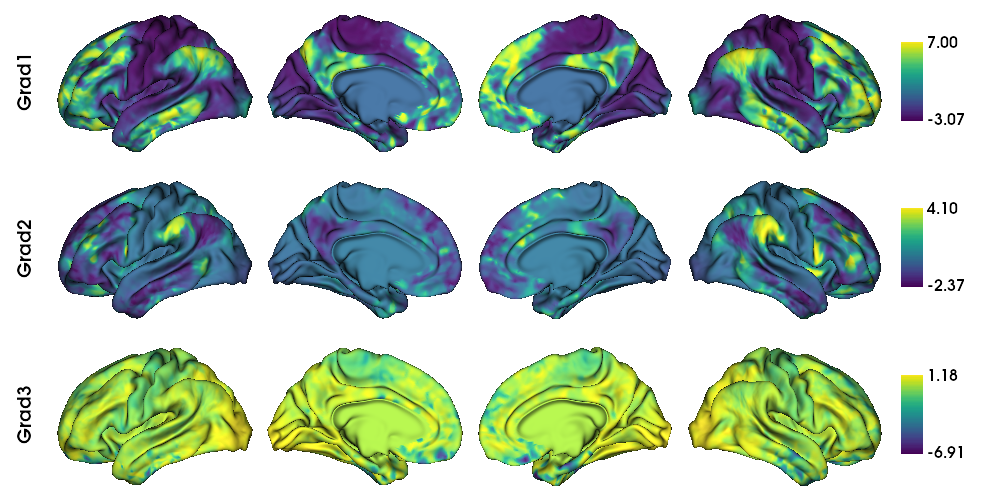

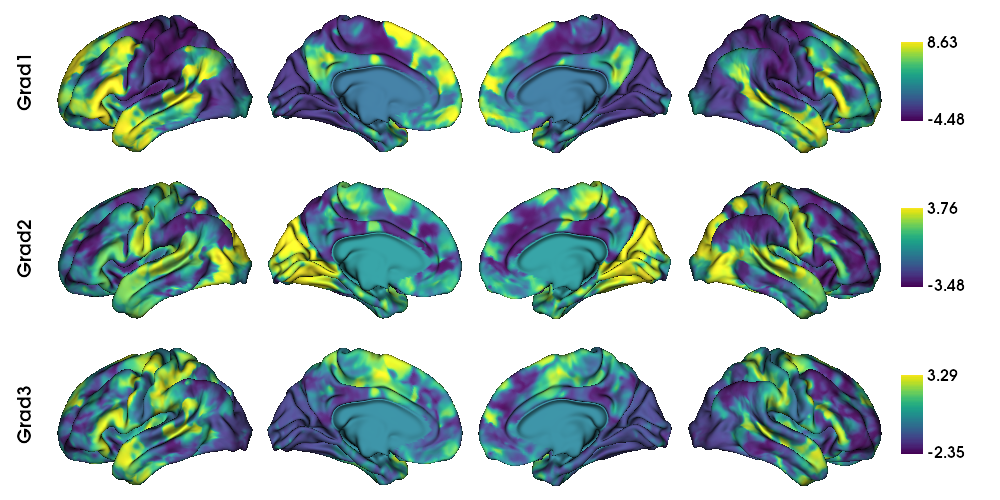

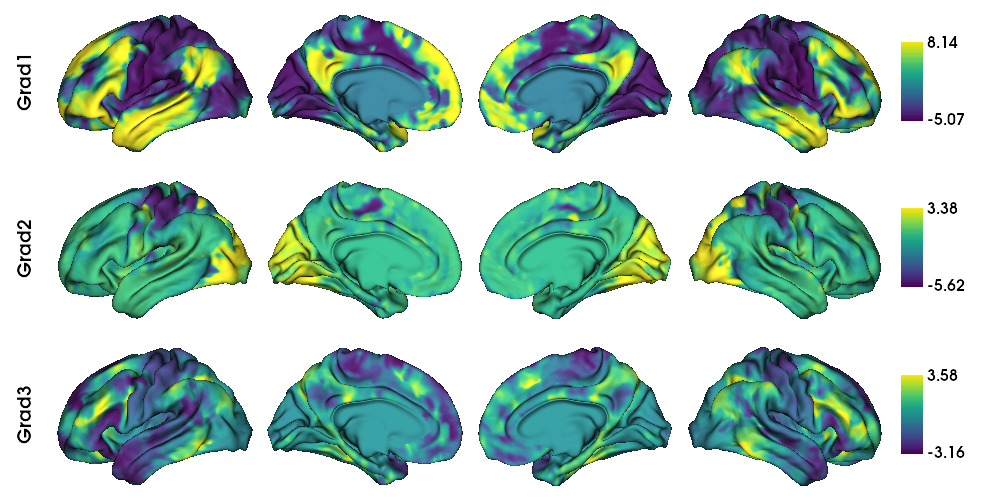

In [177]:
for subject_map in labeled_grads_ses2:
    plot_hemispheres(surf_lh, surf_rh, array_name=subject_map, size=(1000, 500), cmap='viridis',
                    color_bar=True, label_text=['Grad1', 'Grad2', 'Grad3'], zoom=1.5, embed_nb = True)

In [70]:
from sklearn.neighbors import NearestNeighbors
vd_subject_list_ses1 = []
for subject_grads in gradients_ses1:
    vertex_coords = subject_grads.T
    vertex_nbrs = NearestNeighbors(n_neighbors=6, algorithm='auto').fit(vertex_coords)
    distances, indices = vertex_nbrs.kneighbors(vertex_coords)
    mean_distances = distances.mean(axis = 1)
    vd_subject_list_ses1.append(mean_distances)


vd_subject_list_ses2 = []
for subject_grads in gradients_ses2:
    vertex_coords = subject_grads.T
    vertex_nbrs = NearestNeighbors(n_neighbors=6, algorithm='auto').fit(vertex_coords)
    distances, indices = vertex_nbrs.kneighbors(vertex_coords)
    mean_distances = distances.mean(axis = 1)
    vd_subject_list_ses2.append(mean_distances)

In [71]:
vd_ses1 = np.asarray(vd_subject_list_ses1)
vd_ses2 = np.asarray(vd_subject_list_ses2)

In [72]:
vd_ses1.shape

(5, 59412)

In [73]:
vd_surf_ses1 = np.empty((5, 32492*2))
vd_surf_ses1[:] = np.nan
for subject, subject_map in zip(vd_ses1, vd_surf_ses1):
    subject_map[np.isnan(labs) != True] = subject

vd_surf_ses2 = np.empty((5, 32492*2))
vd_surf_ses2[:] = np.nan
for subject, subject_map in zip(vd_ses2, vd_surf_ses2):
    subject_map[np.isnan(labs) != True] = subject

In [88]:
np.stack((vd_surf_ses1, vd_surf_ses1)).reshape(649840)

array([0.03892449, 0.02432026, 0.04619915, ..., 0.02951385, 0.04422942,
       0.02009928])

In [118]:
vertex_wise_ICC

,Type,Description,ICC,F,df1,df2,pval,CI95%,Vertex
1,ICC2,Single random raters,0.697058,15.842473,4,4,0.010157,"[-0.11, 0.96]",0
1,ICC2,Single random raters,0.409045,2.126294,4,4,0.241491,"[-0.91, 0.92]",1
1,ICC2,Single random raters,0.337891,1.958350,4,4,0.265538,"[-0.68, 0.9]",2
1,ICC2,Single random raters,0.500894,2.679333,4,4,0.181453,"[-0.72, 0.94]",3
1,ICC2,Single random raters,0.400964,2.089010,4,4,0.246547,"[-0.92, 0.92]",4
...,...,...,...,...,...,...,...,...,...
1,ICC2,Single random raters,0.717358,16.967281,4,4,0.008948,"[-0.11, 0.97]",59407
1,ICC2,Single random raters,0.911537,17.594469,4,4,0.008366,"[0.35, 0.99]",59408
1,ICC2,Single random raters,0.543079,3.151021,4,4,0.146143,"[-0.51, 0.94]",59409
1,ICC2,Single random raters,0.332222,2.520128,4,4,0.196254,"[-0.28, 0.88]",59410


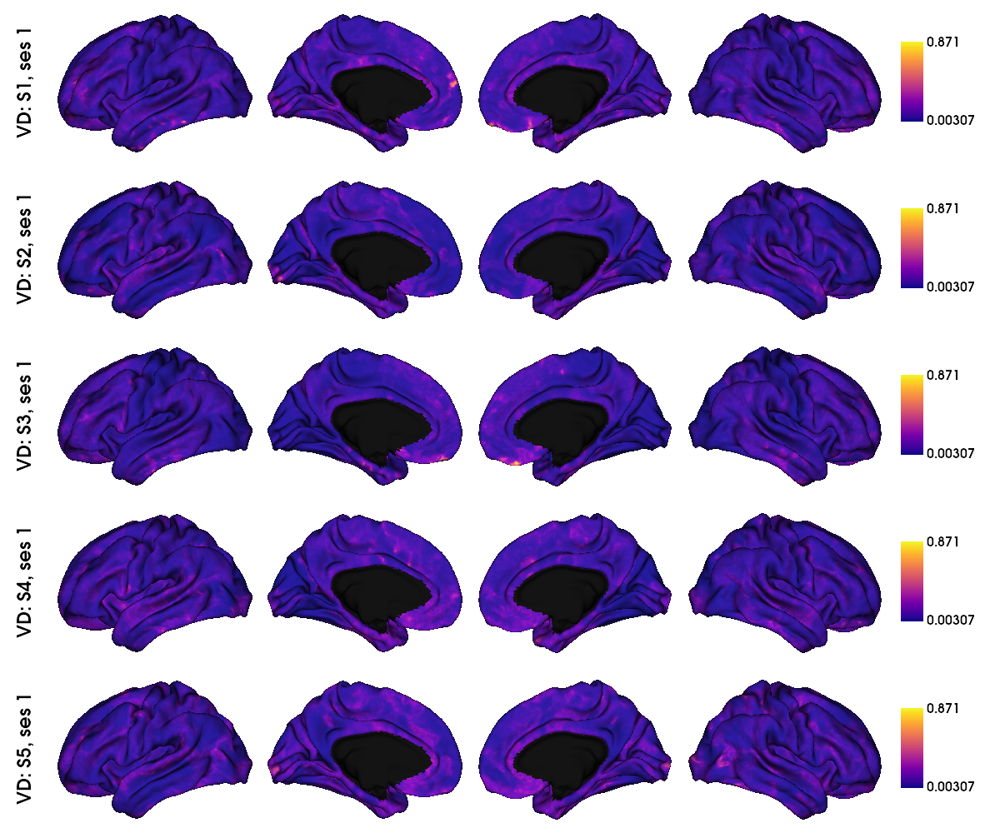

In [92]:
plot_hemispheres(surf_lh, surf_rh, array_name=vd_surf_ses1, size=(1200, 1000), cmap='plasma',
                    color_bar=True, label_text=['VD: S1, ses 1','VD: S2, ses 1', 'VD: S3, ses 1', 'VD: S4, ses 1', 'VD: S5, ses 1'], embed_nb = True, background=(1, 1, 1), zoom = 1.5,color_range=(min(np.stack((vd_surf_ses1, vd_surf_ses1)).reshape(649840)), max(np.stack((vd_surf_ses1, vd_surf_ses1)).reshape(649840))))

<AxesSubplot: ylabel='Count'>

[Text(0.5, -0.05720760638309574, 'VD values')]

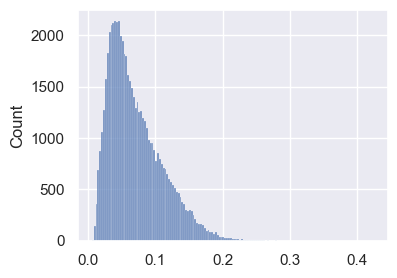

In [117]:
sns.set(rc={'figure.figsize':(4,3)})
sns.histplot(vd_surf_ses2[0])
ax.set(xlabel='VD values')

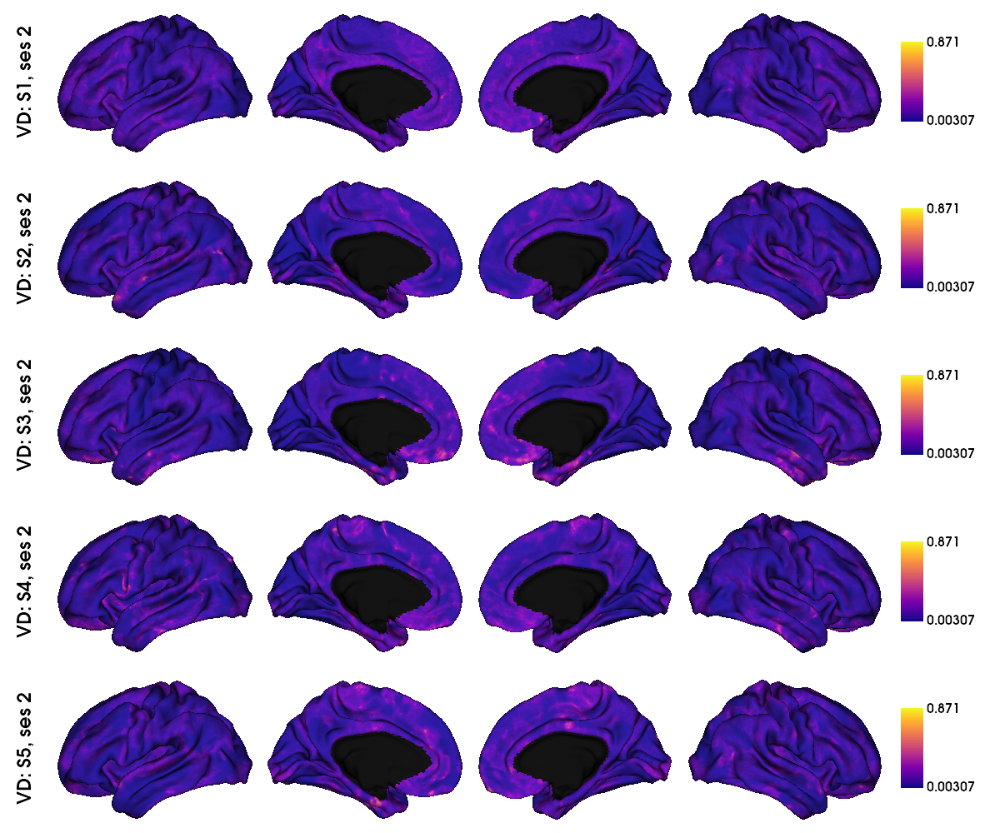

In [91]:
plot_hemispheres(surf_lh, surf_rh, array_name=vd_surf_ses2, size=(1200, 1000), cmap='plasma',
                    color_bar=True, label_text=['VD: S1, ses 2','VD: S2, ses 2', 'VD: S3, ses 2', 'VD: S4, ses 2', 'VD: S5, ses 2'], embed_nb = True, background=(1, 1, 1), zoom = 1.5, color_range=(min(np.stack((vd_surf_ses1, vd_surf_ses1)).reshape(649840)), max(np.stack((vd_surf_ses1, vd_surf_ses1)).reshape(649840))))

Intra-class Correlation 

In [102]:
vertices = np.arange(len(vd_ses1[0]))

In [15]:
vd_ses1_long = vd_ses1.reshape(5 * len(vd_ses1[0]))
vd_ses2_long = vd_ses2.reshape(5 * len(vd_ses2[0]))

In [98]:
# Long format of the 1st session

vd_ses1_df = pd.DataFrame(vd_ses1[0], columns = ["Dispersion"])
vd_ses1_df["Subject"] = subjects[0]
vd_ses1_df["Session"] = 1
vd_ses1_df["Vertex"] = np.arange(len(vd_ses1[0]))

for subject, vd_array in zip(subjects[1:], vd_ses1):
    df = pd.DataFrame(vd_array, columns = ["Dispersion"])
    df["Subject"] = subject
    df["Session"] = 1
    df["Vertex"] = np.arange(len(vd_array))
    vd_ses1_df = pd.concat([vd_ses1_df, df])

In [96]:
# Long format of the 2nd session

vd_ses2_df = pd.DataFrame(vd_ses2[0], columns = ["Dispersion"])
vd_ses2_df["Subject"] = subjects[0]
vd_ses2_df["Session"] = 2
vd_ses2_df["Vertex"] = np.arange(len(vd_ses2[0]))

for subject, vd_array in zip(subjects[1:], vd_ses2):
    df = pd.DataFrame(vd_array, columns = ["Dispersion"])
    df["Subject"] = subject
    df["Session"] = 2
    df["Vertex"] = np.arange(len(vd_array))
    vd_ses2_df = pd.concat([vd_ses2_df, df])

In [99]:
vd_df = pd.concat([vd_ses1_df, vd_ses2_df])

In [103]:
%%capture
from pingouin import intraclass_corr

vertex_wise_ICC = []
for vertex in vertices:
        data = vd_df[vd_df["Vertex"] == vertex]
        ICC = intraclass_corr(data, targets = "Subject", raters = "Session", ratings = "Dispersion")
        ICC["Vertex"] = vertex
        vertex_wise_ICC.append(ICC[ICC["Type"] == "ICC2"])

In [104]:
vertex_wise_ICC = pd.concat(vertex_wise_ICC)

In [105]:
ICC_vis = vertex_wise_ICC[["ICC", "pval"]]

In [106]:
ICC_vis.loc[ICC_vis["pval"] > 0.05, "ICC"] = "nan"

In [107]:
ICC_plot = np.empty(len(labs))
ICC_plot[:] = np.nan
ICC_plot[np.isnan(labs) != True] = ICC_vis["ICC"]

In [108]:
ICC_plot[ICC_plot == "nan"] = np.nan

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_48652/131888083.py:1: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  ICC_plot[ICC_plot == "nan"] = np.nan


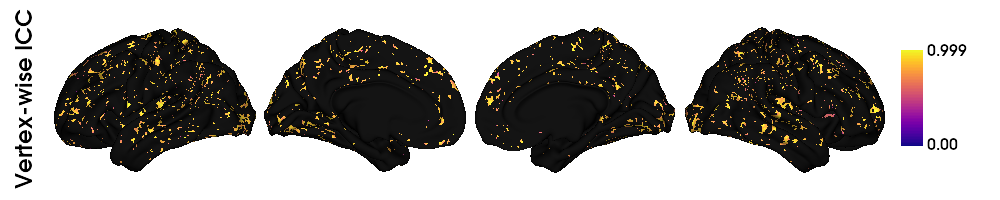

In [109]:
plot_hemispheres(surf_lh, surf_rh, array_name=ICC_plot, size=(1000, 200), cmap='plasma',
                    color_bar=True, label_text=['Vertex-wise ICC'], embed_nb = True, background=(1, 1, 1), zoom = 1.3, color_range=(0, max(ICC_plot)))

## Resampling surfaces to 4k

In [7]:
from austin_utils import save_gifti

In [102]:
sessions = [labeled_grads_ses1, labeled_grads_ses2]
hemi_L = "L"
hemi_R = "R"
grads = ["1", "2", "3"]
filenames_L= []
filenames_R = []
gii_paths_L= []
gii_paths_R = []
for session, session_n in zip(sessions, ["1", "2"]):
    for subject, id in zip(session, subjects):
        for gradient_array, grad in zip(subject, grads):
            filename_L = "%s_grad%s_ses%s_%s" % (id, grad, session_n, hemi_L)
            filename_R = "%s_grad%s_ses%s_%s" % (id, grad, session_n, hemi_R)
            save_gifti(gradient_array[:int(len(gradient_array)/2)], filename_L)
            save_gifti(gradient_array[int(len(gradient_array)/2):], filename_R)
            filenames_L.append(filename_L)
            filenames_R.append(filename_R)
            gii_paths_L.append("/Users/VictoriaShevchenko/Documents/PhD/"+ filename_L + ".func.gii")
            gii_paths_R.append("/Users/VictoriaShevchenko/Documents/PhD/"+ filename_R + ".func.gii")


            

In [196]:
np.asarray(np.where(np.isnan(labeled_grads_ses1[0]) == True))

array([], shape=(2, 0), dtype=int64)

In [195]:
labeled_grads_ses1[0].shape

(3, 64984)

In [103]:
%%capture
# Resampling surface gradient maps to 4k
directory = "/Users/VictoriaShevchenko/Documents/PhD/HCP/resampled_grads/"
import os
for path_L, filename_L in zip(gii_paths_L, filenames_L):
    out_file = directory + filename_L + "4k.func.gii"
    os.system("wb_command -metric-resample %s /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.L.sphere.32k_fs_LR.surf.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.L.sphere.4k_fs_LR.surf.gii BARYCENTRIC %s" %(path_L, out_file))

for path_R, filename_R in zip(gii_paths_R, filenames_R):
    out_file = directory + filename_R + "4k.func.gii"
    os.system("wb_command -metric-resample %s /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.R.sphere.32k_fs_LR.surf.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.R.sphere.4k_fs_LR.surf.gii BARYCENTRIC %s" %(path_R, out_file))

In [152]:
os.system("wb_command -metric-resample /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.32k.L.label.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.L.sphere.32k_fs_LR.surf.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.L.sphere.4k_fs_LR.surf.gii BARYCENTRIC /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.4k.L.label_metric.gii")
os.system("wb_command -metric-resample /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.32k.R.label.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.R.sphere.32k_fs_LR.surf.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.R.sphere.4k_fs_LR.surf.gii BARYCENTRIC /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.4k.R.label_metric.gii")

os.system("wb_command -label-resample /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.32k.L.label.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.L.sphere.32k_fs_LR.surf.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.L.sphere.4k_fs_LR.surf.gii BARYCENTRIC /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.4k.L.label.gii")
os.system("wb_command -label-resample /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.32k.R.label.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.R.sphere.32k_fs_LR.surf.gii /Users/VictoriaShevchenko/Documents/PhD/HCP/spheres/S1200.R.sphere.4k_fs_LR.surf.gii BARYCENTRIC /Users/VictoriaShevchenko/Documents/PhD/HCP/labels/fsLR.4k.R.label.gii")

0

0

0

0

In [121]:
grads = ["1", "2", "3"]
sessions_4k = []
directory = "HCP/resampled_grads/"
for session_n in ["1", "2"]:
    subjects_grads_4k = []
    for subject_id in subjects:
        gradients = []
        for grad in grads:
            path_L = directory + "%s_grad%s_ses%s_L4k.func.gii" % (subject_id, grad, session_n)
            path_R = directory + "%s_grad%s_ses%s_R4k.func.gii" % (subject_id, grad, session_n)
            gradient_L = nib.load(path_L).agg_data()
            gradient_R = nib.load(path_R).agg_data()
            grad = np.concatenate((gradient_L, gradient_R))
            gradients.append(grad)
            #print("gradient: ", grad)
        gradients = np.stack((gradients))
        #print("gradients: ", gradients)
        subjects_grads_4k.append(gradients)
    subjects_grads_4k = np.stack((subjects_grads_4k))
    #print("subjects_grads_4k: ", subjects_grads_4k)
    sessions_4k.append(subjects_grads_4k)
sessions_4k = np.stack((sessions_4k))
    

In [105]:
gradients4k_labeled_ses1 = sessions_4k[0]
gradients4k_labeled_ses2 = sessions_4k[1]

In [122]:
np.asarray(np.where(gradients4k_labeled_ses1[0][0]== 0))[0].shape

(660,)

In [120]:
np.isnan(gradients4k_labeled_ses1[0][0])

array([False, False, False, ..., False, False, False])

In [119]:
np.asarray(np.where(np.isnan(gradients4k_labeled_ses1[0][0])== True))

array([], shape=(1, 0), dtype=int64)

In [116]:
gradients4k_labeled_ses1[0][0].shape

(8004,)

In [41]:
gradients4k_labeled_ses1[0].shape

(3, 8004)

In [198]:
from neuromaps.datasets import fetch_atlas

fslr = fetch_atlas('fsLR', '4k')
fslr_left_mid = nib.load(fslr['midthickness'].L)
fslr_right_mid = nib.load(fslr['midthickness'].R)

nib.save(fslr_left_mid, "HCP/surfaces/fslr_L_mid_4k")
nib.save(fslr_right_mid, "HCP/surfaces/fslr_R_mid_4k")

Text(0.5, 1.0, 'Unaligned: S1, ses 1, Grad 2')

Text(0.5, 1.0, 'Unaligned: S1, ses 1, Grad 2')

Text(0.5, 1.0, 'Unaligned: S2, ses 1, Grad 2')

Text(0.5, 1.0, 'Unaligned: S2, ses 1, Grad 2')

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/3064860039.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s1_ses1.show()
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/3064860039.py:29: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s1_ses2.show()
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/3064860039.py:30: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s2_ses1.show()
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/3064860039.py:31: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s2_ses2.show()


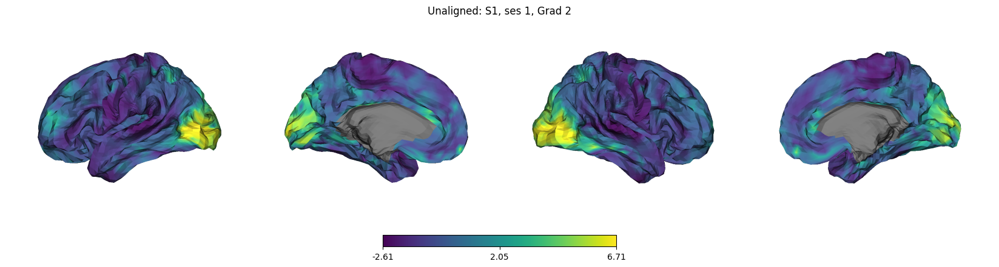

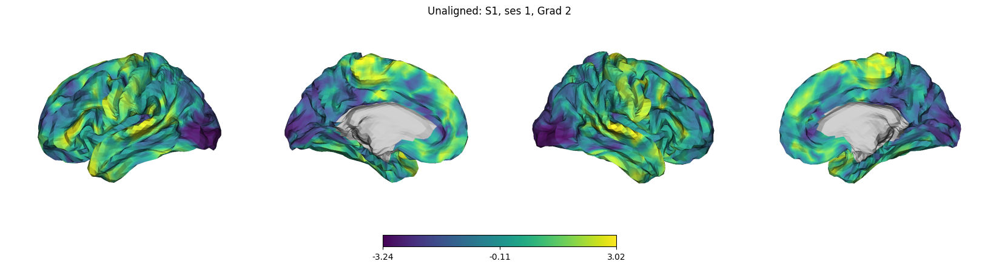

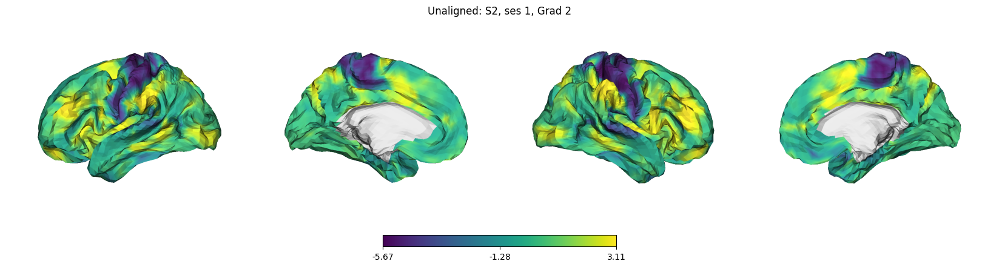

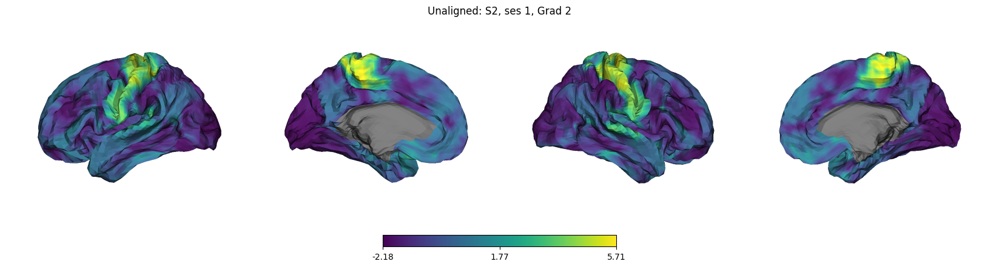

In [200]:
from surfplot.plotting import Plot

grad2_s1_ses1 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)
grad2_s1_ses2 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)
grad2_s2_ses1 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)
grad2_s2_ses2 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)

grad2_s1_ses1.add_layer(gradients4k_labeled_ses1[0][1], cmap='viridis')
grad2_s1_ses2.add_layer(gradients4k_labeled_ses2[0][1], cmap='viridis')

grad2_s2_ses1.add_layer(gradients4k_labeled_ses1[1][1], cmap='viridis')
grad2_s2_ses2.add_layer(gradients4k_labeled_ses2[1][1], cmap='viridis')



grad2_s1_ses1 = grad2_s1_ses1.build()
grad2_s1_ses1.axes[0].set_title("Unaligned: S1, ses 1, Grad 2")

grad2_s1_ses2 = grad2_s1_ses2.build()
grad2_s1_ses2.axes[0].set_title("Unaligned: S1, ses 1, Grad 2")

grad2_s2_ses1 = grad2_s2_ses1.build()
grad2_s2_ses1.axes[0].set_title("Unaligned: S2, ses 1, Grad 2")

grad2_s2_ses2 = grad2_s2_ses2.build()
grad2_s2_ses2.axes[0].set_title("Unaligned: S2, ses 1, Grad 2")

grad2_s1_ses1.show()
grad2_s1_ses2.show()
grad2_s2_ses1.show()
grad2_s2_ses2.show()

In [107]:
sessions_4k = sessions_4k.reshape(10, 3, 8004)
#gradients4k_all_sessions = [subject_grads[:, ~(subject_grads == 0).all(axis=0)] for subject_grads in sessions_4k]


In [110]:
sessions_4k[0][0].shape

(8004,)

In [296]:
from brainspace.gradient.alignment import ProcrustesAlignment

alignment = ProcrustesAlignment()
gradients4k_all_sessions_aligned = alignment.fit(gradients4k_all_sessions[1:], gradients4k_all_sessions[0])

In [297]:
np.save(file = "aligned_gradients.npy", arr = np.asarray(gradients4k_all_sessions_aligned.aligned_))

In [166]:
all_gradients4k_all_sessions_aligned[0][0].shape
cortical_indices_4k_metric.shape

(7344,)

(8004,)

In [162]:
all_gradients4k_all_sessions_aligned = np.load("aligned_gradients.npy")
all_gradients4k_all_sessions_aligned = np.insert(arr = all_gradients4k_all_sessions_aligned, obj = 0, values = np.expand_dims(gradients4k_all_sessions[0], axis = 0), axis = 0)

In [182]:
labs_L_4k_metric = nib.load('HCP/labels/fsLR.4k.L.label_metric.gii').agg_data()
labs_R_4k_metric = nib.load('HCP/labels/fsLR.4k.R.label_metric.gii').agg_data()
labs_4k_metric  = np.concatenate((labs_L_4k_metric, labs_R_4k_metric))

In [154]:
labs_L_4k = nib.load('HCP/labels/fsLR.4k.L.label.gii').agg_data()
labs_R_4k = nib.load('HCP/labels/fsLR.4k.R.label.gii').agg_data()
labs_4k  = np.concatenate((labs_L_4k, labs_R_4k))

In [190]:
labs_4k_metric = labs_4k_metric.astype(float)
labs_4k_metric[labs_4k_metric == 0] = np.nan
cortical_indices_4k_metric = np.where(np.isnan(labs_4k_metric) == False)[0]

labs_4k = labs_4k.astype(float)
labs_4k[labs_4k == 0] = np.nan
medial_wall_mask = np.where(np.isnan(labs_4k) == True)[0]

In [191]:
medial_wall_mask.shape

(685,)

In [189]:
labs_4k_metric[np.isnan(labs_4k_metric) == False].shape

(7344,)

In [181]:
labs_4k_metric[np.isnan(labs_4k_metric) != True].shape

(7319,)

In [193]:
grads_ses1_4k_aligned = all_gradients4k_all_sessions_aligned[:int(len(all_gradients4k_all_sessions_aligned)/2)] # shape (subj, grad, vertices)
grads_ses2_4k_aligned = all_gradients4k_all_sessions_aligned[int(len(all_gradients4k_all_sessions_aligned)/2):]

labeled_grads_ses1_4k_aligned = np.empty((5, 3, 8004))
labeled_grads_ses1_4k_aligned[:] = np.nan

labeled_grads_ses2_4k_aligned = np.empty((5, 3, 8004))
labeled_grads_ses2_4k_aligned[:] = np.nan

for subject, subject_map in zip(grads_ses1_4k_aligned, labeled_grads_ses1_4k_aligned):
    subject_map[0][cortical_indices_4k_metric] = subject[0]
    subject_map[0][medial_wall_mask] = np.nan
    subject_map[1][cortical_indices_4k_metric] = subject[1]
    subject_map[1][medial_wall_mask] = np.nan
    subject_map[2][cortical_indices_4k_metric] = subject[2]
    subject_map[2][medial_wall_mask] = np.nan

for subject, subject_map in zip(grads_ses2_4k_aligned, labeled_grads_ses2_4k_aligned):
    subject_map[0][cortical_indices_4k_metric] = subject[0]
    subject_map[0][medial_wall_mask] = np.nan
    subject_map[1][cortical_indices_4k_metric] = subject[1]
    subject_map[1][medial_wall_mask] = np.nan
    subject_map[2][cortical_indices_4k_metric] = subject[2]
    subject_map[2][medial_wall_mask] = np.nan

ValueError: shape mismatch: value array of shape (7344,) could not be broadcast to indexing result of shape (7319,)

In [197]:
labeled_grads_ses1_4k_aligned[0][1]

array([-0.48637721, -1.36099386, -0.46750632, ...,  0.04516719,
       -0.21844105,  0.10850967])

Text(0.5, 1.0, 'Procrustes aligned: S1, ses 1, Grad 2')

Text(0.5, 1.0, 'Procrustes aligned: S1, ses 1, Grad 2')

Text(0.5, 1.0, 'Procrustes aligned: S2, ses 1, Grad 2')

Text(0.5, 1.0, 'Procrustes aligned: S2, ses 1, Grad 2')

/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/2890690409.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s1_ses1.show()
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/2890690409.py:26: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s1_ses2.show()
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/2890690409.py:27: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s2_ses1.show()
/var/folders/2m/72fcyjmd7vs3g18rkfwx7nw40000gn/T/ipykernel_87952/2890690409.py:28: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  grad2_s2_ses2.show()


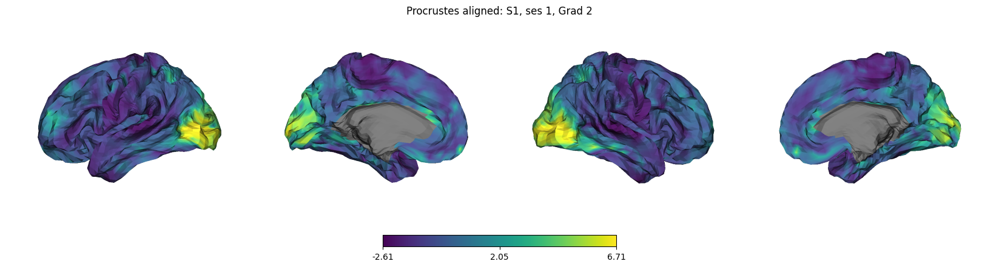

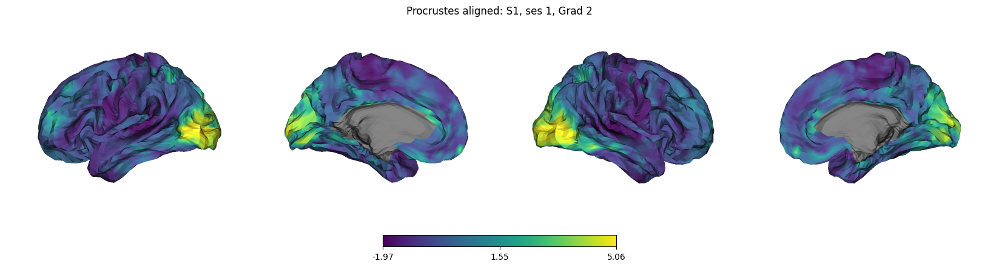

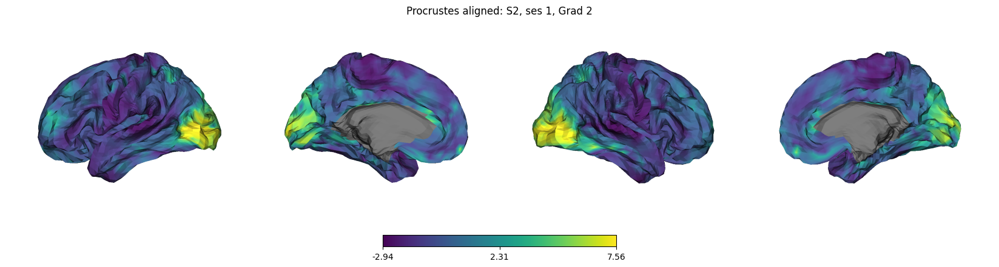

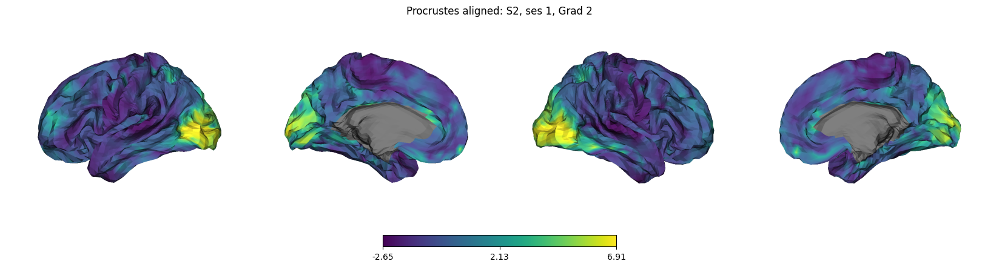

In [201]:
grad2_s1_ses1 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)
grad2_s1_ses2 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)
grad2_s2_ses1 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)
grad2_s2_ses2 = Plot("HCP/surfaces/fslr_L_mid_4k.gii", "HCP/surfaces/fslr_R_mid_4k.gii", layout='row', zoom=1.2, size=(2000,400), mirror_views=False)

grad2_s1_ses1.add_layer(labeled_grads_ses1_4k_aligned[0][1], cmap='viridis')
grad2_s1_ses2.add_layer(labeled_grads_ses2_4k_aligned[0][1], cmap='viridis')

grad2_s2_ses1.add_layer(labeled_grads_ses1_4k_aligned[1][1], cmap='viridis')
grad2_s2_ses2.add_layer(labeled_grads_ses2_4k_aligned[1][1], cmap='viridis')


grad2_s1_ses1 = grad2_s1_ses1.build()
grad2_s1_ses1.axes[0].set_title("Procrustes aligned: S1, ses 1, Grad 2")

grad2_s1_ses2 = grad2_s1_ses2.build()
grad2_s1_ses2.axes[0].set_title("Procrustes aligned: S1, ses 1, Grad 2")

grad2_s2_ses1 = grad2_s2_ses1.build()
grad2_s2_ses1.axes[0].set_title("Procrustes aligned: S2, ses 1, Grad 2")

grad2_s2_ses2 = grad2_s2_ses2.build()
grad2_s2_ses2.axes[0].set_title("Procrustes aligned: S2, ses 1, Grad 2")

grad2_s1_ses1.show()
grad2_s1_ses2.show()
grad2_s2_ses1.show()
grad2_s2_ses2.show()

In [263]:
from sklearn.neighbors import NearestNeighbors

vd_subject_list_4k_ses1 = []
for subject_grads in gradients4k_labeled_ses1:
    gradient4k = subject_grads[:, ~np.isnan(subject_grads).all(axis=0)]
    vertex_coords = gradient4k.T
    vertex_nbrs = NearestNeighbors(n_neighbors=6, algorithm='auto').fit(vertex_coords)
    distances, indices = vertex_nbrs.kneighbors(vertex_coords)
    mean_distances = distances.mean(axis = 1)
    vd_subject_list_4k_ses1.append(mean_distances)


vd_subject_list_4k_ses2 = []
for subject_grads in gradients4k_labeled_ses2:
    gradient4k = subject_grads[:, ~np.isnan(subject_grads).all(axis=0)]
    vertex_coords = gradient4k.T
    vertex_nbrs = NearestNeighbors(n_neighbors=6, algorithm='auto').fit(vertex_coords)
    distances, indices = vertex_nbrs.kneighbors(vertex_coords)
    mean_distances = distances.mean(axis = 1)
    vd_subject_list_4k_ses2.append(mean_distances)

In [261]:

gradients_labeled_ses1[0][:, ~np.isnan(gradients_labeled_ses1[0]).all(axis=0)].shape

(3, 7293)

In [256]:
gradients_labeled_ses1[0][0][~np.isnan(gradients_labeled_ses1[0][0])].shape

(7293,)

In [ ]:
gradients_labeled_ses1[0]

In [247]:
gradients_labeled_ses1[0].shape

(21879,)

In [245]:
gradients_ses2[0].T.shape

(59412, 3)

In [ ]:
vd_4k_ses1 = np.asarray(vd_subject_list_ses1)
vd_4k_ses2 = np.asarray(vd_subject_list_ses2)